<a href="https://colab.research.google.com/github/RaffyJO/PCVK_Ganjil_2024/blob/main/Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **MODUL 5 – Operasi Aritmatika dan Logika - Gamma Correction, Image Depth, PSNR, Average Denoising, Image Masking**

**Nama: Raffy Jamil Octavialdy
<br>
Kelas: TI - 3D
<br>
NIM: 2241720082**

1. **Buat Gamma Correction sesuai dengan petunjuk berikut**
<br>
Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image dengan gamma correction sesuai rumus yang telah diberikan.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


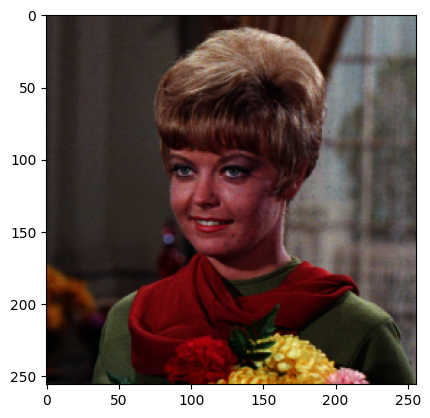

In [2]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img_bgr = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')
img = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
plt.imshow(img)

In [3]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


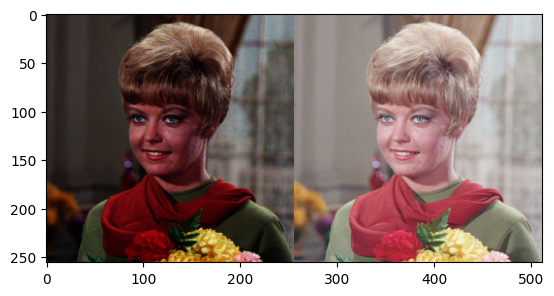

In [4]:
# l' = 255(l\255)^1/y

img_corrected = np.uint8(255 * np.power(img / 255, 1 / gamma));

plt.imshow(cv.hconcat((img, img_corrected)))

2. **Buat Simulasi Image Depth**
<br>
Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga 255 (1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000 0000) hingga 127 (111 1111), Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst.

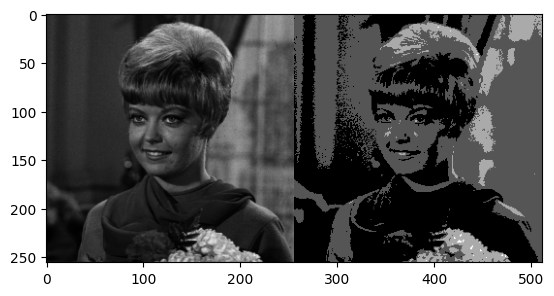

In [5]:
img_gray = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff', cv.IMREAD_GRAYSCALE)
img_gray = cv.cvtColor(img_gray, cv.COLOR_BGR2RGB)
bit_depth=2
level = 255 / (pow(2,bit_depth)-1)
depth_image = np.zeros(img_gray.shape, img_gray.dtype)

for y in range(img_gray.shape[0]):
  for x in range(img_gray.shape[1]):
    depth_image[y][x] = np.round(img_gray[y][x] / level) * level

plt.imshow(cv.hconcat((img_gray, depth_image)))

3. **Buat modul Average Denoising**
Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab sebelumnya. Citra asli sudah disediakan pada /images/galaxy.jpg. 100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder, gunakan modul glob (import glob).

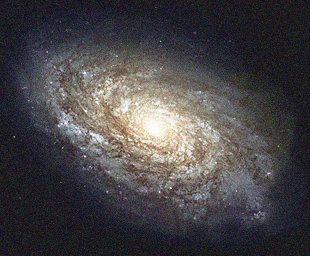

5 images
psnr modul: 27.543544113841754
psnr cv: 19.520456590189614


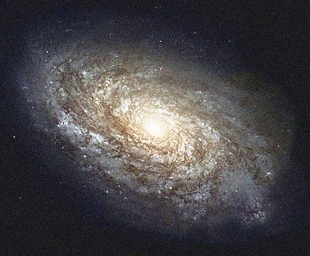

10 images
psnr modul: 27.54638120243548
psnr cv: 19.7311129724946


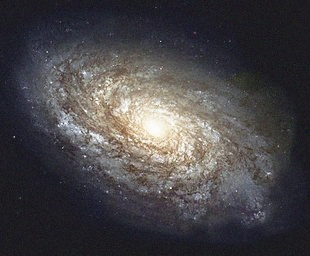

20 images
psnr modul: 27.513820864842916
psnr cv: 19.840488019110655


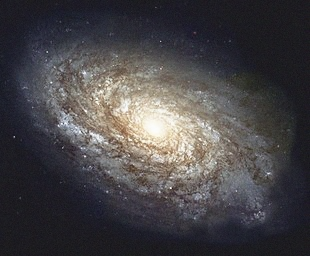

40 images
psnr modul: 27.46392089030487
psnr cv: 19.89291814527895


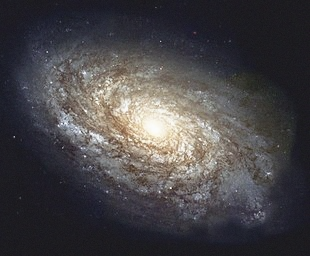

80 images
psnr modul: 27.396876785859842
psnr cv: 19.91703222425813


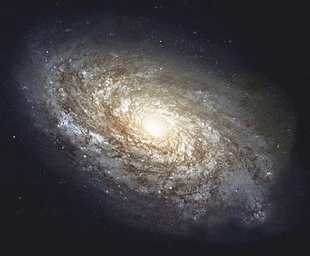

100 images
psnr modul: 27.370931279516654
psnr cv: 19.92196095594035


In [7]:
import glob

cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

galaxy = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

cv_img = np.array(cv_img)

avg_5 = np.uint8(np.mean(cv_img[:5], axis=0))

from math import log10, sqrt

def PSNR(img1, img2):
  mse = np.mean((img1 - img2) ** 2)
  if(mse == 0): # MSE 0 maka tidak ada noise sam a sekali, sehingga PSNR tidak memiliki arti
    return 100
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(mse))
  return psnr

avgs = [5, 10, 20, 40, 80, 100]

for i in avgs:
  avg = np.uint8(np.mean(cv_img[:i], axis=0))
  psnr = PSNR(galaxy, avg)
  psnrcv = cv.PSNR(galaxy, avg)
  cv2_imshow(avg)
  print(f"{i} images\npsnr modul: {psnr}\npsnr cv: {psnrcv}")

Dari hasil percobaan di atas, terdapat perbedaan ketika menggunakan rumus PSNR dari modul dan dari library opencv, dimana jika menggunakan rumus dari modul, hasilnya terlihat tidak konsisten. Hasil terbaik PNSR modul diperoleh dengan melakukan averaging terhadap 10 gambar, sedangkan hasil yang lebih konsisten didapat ketika menggunakan fungsi PSNR dari modul opencv, yang mana hasil terbaik diperoleh dengan melakukan average denoising dengan 100 image.

4. **Buat image masking untuk image berikut. Image kiri adalah image asli (image KTP), sedangkan image paling kanan adalah hasilnya:**

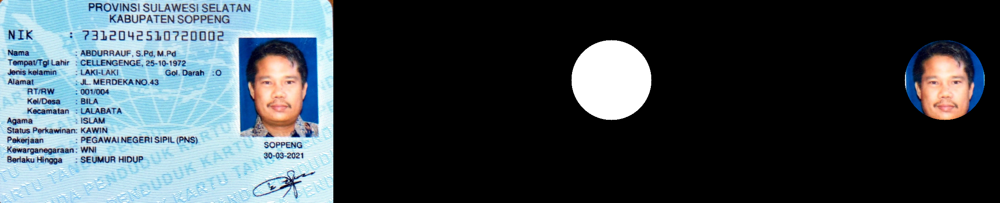

In [17]:
path='/content/drive/MyDrive/PCVK/Images/KTP7.jpeg'
KTP = cv.imread(path)
mask = np.zeros_like(KTP)

center1 = (667, 192)
radius1 = 96

cv.circle(mask, center1, radius1, (255, 255, 255), -1)
masked_image = cv.bitwise_and(KTP, mask)

final_frame = cv.hconcat((KTP,mask,masked_image))
cv2_imshow(final_frame)

5. **Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini. Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.**

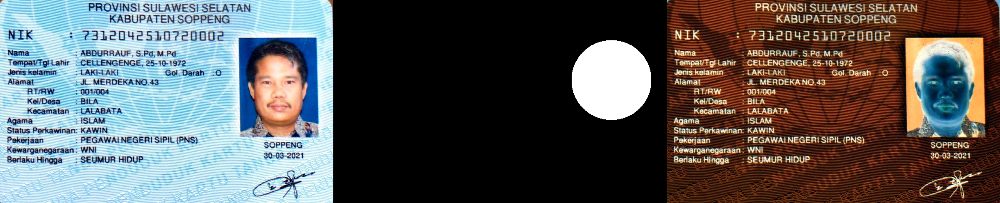

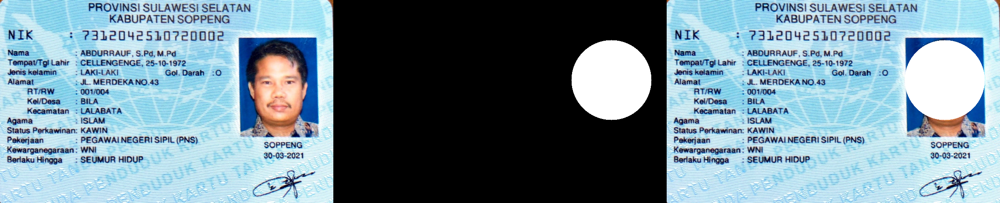

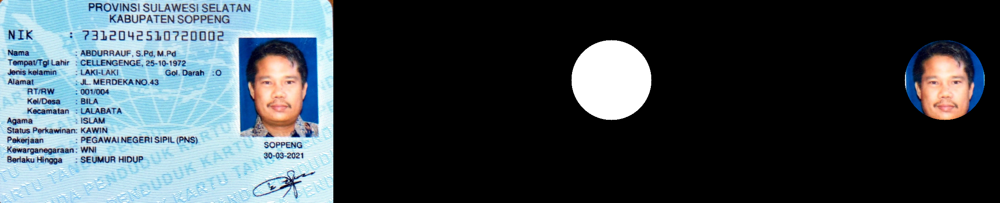

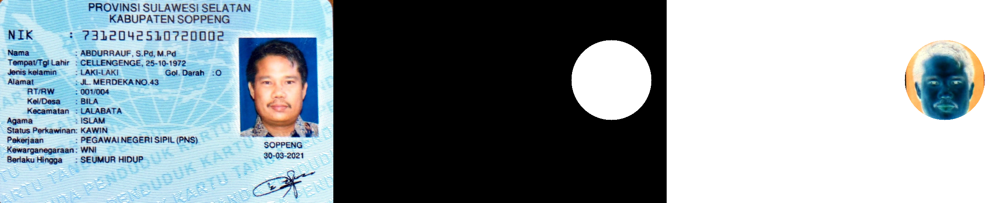

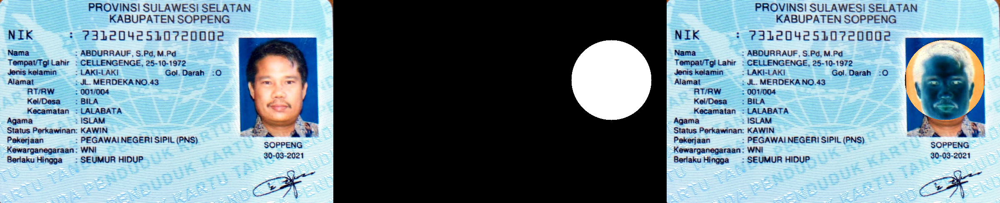

In [18]:
# not, or, and, nand, xor

inot = ~KTP
ior = KTP | mask
iand = KTP & mask
inand = ~(KTP & mask)
ixor = KTP ^ mask

cv2_imshow(cv.hconcat((KTP, mask, inot)))
cv2_imshow(cv.hconcat((KTP, mask, ior)))
cv2_imshow(cv.hconcat((KTP, mask, iand)))
cv2_imshow(cv.hconcat((KTP, mask, inand)))
cv2_imshow(cv.hconcat((KTP, mask, ixor)))

1. inot = ~KTP
  - Ini adalah operasi negasi atau bitwise NOT pada citra KTP. Setiap piksel pada citra KTP akan dibalik: jika hitam (nilai piksel 0), maka pada inot akan menjadi putih (nilai maksimal, misalnya 255), dan sebaliknya. Jadi, citra inot akan menjadi invers dari citra KTP.

2. ior = KTP | mask
  - Ini adalah operasi bitwise OR antara citra KTP dan mask. Hasil operasi ior akan mengandung titik putih (nilai 1) di lokasi mana pun yang memiliki titik putih di salah satu dari kedua citra. Dengan kata lain, jika ada piksel bernilai 1 di KTP atau mask, maka hasilnya pada ior akan bernilai 1.

3. iand = KTP & mask
  - Ini adalah operasi bitwise AND antara KTP dan mask. Hasilnya, piksel hanya akan menjadi putih di iand jika kedua citra KTP dan mask memiliki nilai putih (1) di posisi yang sama. Jika salah satu atau keduanya hitam, hasilnya hitam (0).

4. inand = ~(KTP & mask)
  - Ini adalah negasi dari operasi bitwise AND. Artinya, hasilnya akan putih (nilai 1) kecuali kedua citra KTP dan mask memiliki titik putih di posisi yang sama. Jadi, kebalikannya adalah: jika kedua citra memiliki titik yang sama-sama putih di suatu lokasi, hasilnya akan hitam (0) pada inand.

5. ixor = KTP ^ mask
  - Ini adalah operasi bitwise XOR antara KTP dan mask. Hasilnya akan putih (nilai 1) hanya jika satu dari dua citra memiliki titik putih pada posisi tertentu, tetapi tidak keduanya. Jika kedua citra memiliki nilai yang sama (baik putih-putih atau hitam-hitam), hasilnya akan hitam (0).